In [32]:
# Core PyTorch and TorchVision imports
import torch
import torchvision
from torchvision.models.detection.mask_rcnn import MaskRCNN_ResNet50_FPN_Weights
from torchvision.models.detection import maskrcnn_resnet50_fpn
import torchvision.transforms as T
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.ops import box_iou

# Image processing and visualization
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# System utilities
import os
import random
from tqdm import tqdm

print("✅ All libraries imported successfully!")
print(f"PyTorch version: {torch.__version__}")
print(f"TorchVision version: {torchvision.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

✅ All libraries imported successfully!
PyTorch version: 2.5.1+cu121
TorchVision version: 0.20.1+cu121
CUDA available: True


In [20]:
# ================================================================================================
# 1. DEVICE SETUP AND MODEL INITIALIZATION
# ================================================================================================

def setup_device():
    """
    Setup and configure the computation device (GPU/CPU)
    
    Returns:
        torch.device: The selected device for computation
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    if torch.cuda.is_available():
        print(f"🚀 Using GPU: {torch.cuda.get_device_name(0)}")
        print(f"   GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
        print(f"   CUDA Version: {torch.version.cuda}")
    else:
        print("⚠️  GPU not available, using CPU")
        print("   Note: Training will be significantly slower on CPU")
    
    return device

def load_pretrained_maskrcnn(device):
    """
    Load pre-trained Mask R-CNN model with COCO weights
    
    Args:
        device (torch.device): Device to load the model on
        
    Returns:
        torch.nn.Module: Pre-trained Mask R-CNN model
    """
    print("\n📥 Loading pre-trained Mask R-CNN model...")
    
    # Load pre-trained weights from COCO dataset
    weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights=weights)
    
    # Move model to specified device
    model.to(device)
    
    # Set model to evaluation mode (will be changed to training mode later)
    model.eval()
    
    print("✅ Mask R-CNN model loaded successfully!")
    print(f"   Architecture: ResNet-50 FPN")
    print(f"   Pre-trained on: COCO Dataset")
    print(f"   Device: {device}")
    
    return model

# Execute setup
device = setup_device()
model = load_pretrained_maskrcnn(device)

🚀 Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU
   GPU Memory: 8.0 GB
   CUDA Version: 12.1

📥 Loading pre-trained Mask R-CNN model...
✅ Mask R-CNN model loaded successfully!
   Architecture: ResNet-50 FPN
   Pre-trained on: COCO Dataset
   Device: cuda


In [21]:
# ================================================================================================
# 2. MODEL CUSTOMIZATION FOR BIRD DETECTION
# ================================================================================================

def customize_maskrcnn_for_birds(model, num_classes, device):
    """
    Customize Mask R-CNN model for bird detection by modifying the classification and mask heads
    
    Args:
        model (torch.nn.Module): Pre-trained Mask R-CNN model
        num_classes (int): Number of classes (background + bird = 2)
        device (torch.device): Device to move the model to
        
    Returns:
        torch.nn.Module: Customized model for bird detection
    """
    print(f"\n🔧 Customizing model for {num_classes} classes (background + bird)...")
    
    # Move model to CPU temporarily for head modification (recommended practice)
    model.to("cpu")
    
    # 1. Replace Box Predictor (Classification and Bounding Box Regression)
    in_features_box = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
        in_features_box, num_classes
    )
    print(f"   ✅ Box predictor updated: {in_features_box} -> {num_classes} classes")
    
    # 2. Replace Mask Predictor (Instance Segmentation)
    in_features_mask = model.roi_heads.mask_predictor.mask_fcn_logits.in_channels
    hidden_layer = model.roi_heads.mask_predictor.mask_fcn_logits.out_channels
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
        in_features_mask, hidden_layer, num_classes
    )
    print(f"   ✅ Mask predictor updated: {in_features_mask} -> {hidden_layer} -> {num_classes} classes")
    
    # Move model back to the specified device
    model.to(device)
    
    print(f"🎯 Model successfully customized for bird detection!")
    print(f"   Device: {device}")
    print(f"   Ready for fine-tuning")
    
    return model

# Configuration
NUM_CLASSES_BIRDS = 2  # 1 for 'bird' + 1 for 'background'

# Customize the model
model = customize_maskrcnn_for_birds(model, NUM_CLASSES_BIRDS, device)

# Display model summary
print(f"\n📊 Model Summary:")
print(f"   Total parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"   Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")
print(f"   Model size: ~{sum(p.numel() * p.element_size() for p in model.parameters()) / 1024**2:.1f} MB")


🔧 Customizing model for 2 classes (background + bird)...
   ✅ Box predictor updated: 1024 -> 2 classes
   ✅ Mask predictor updated: 256 -> 91 -> 2 classes
🎯 Model successfully customized for bird detection!
   Device: cuda
   Ready for fine-tuning

📊 Model Summary:
   Total parameters: 43,752,940
   Trainable parameters: 43,530,540
   Model size: ~166.9 MB


In [22]:
# ================================================================================================
# 3. DATASET PREPARATION AND LOADING
# ================================================================================================
def parse_bounding_boxes(boxes_file):
    """
    Parse bounding boxes from CUB dataset file
    
    Args:
        boxes_file (str): Path to bounding_boxes.txt file
        
    Returns:
        dict: Mapping of image_id to [x, y, width, height]
    """
    box_data = {}
    try:
        with open(boxes_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                image_id = int(parts[0])
                x, y, w, h = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                box_data[image_id] = [x, y, w, h]
        print(f"   ✅ Loaded {len(box_data)} bounding boxes")
    except Exception as e:
        print(f"   ❌ Error loading bounding boxes: {e}")
        raise
    return box_data

def parse_image_names(images_file):
    """
    Parse image names from CUB dataset file
    
    Args:
        images_file (str): Path to images.txt file
        
    Returns:
        dict: Mapping of image_id to image filename
    """
    image_names = {}
    try:
        with open(images_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                image_id = int(parts[0])
                image_name = parts[1]
                image_names[image_id] = image_name
        print(f"   ✅ Loaded {len(image_names)} image names")
    except Exception as e:
        print(f"   ❌ Error loading image names: {e}")
        raise
    return image_names

class BirdMaskRCNNDataset(Dataset):
    """
    Custom Dataset class for CUB-200-2011 bird dataset with segmentation masks
    
    This dataset combines:
    - Original CUB images
    - Bounding box annotations
    - Custom segmentation masks
    """
    
    def __init__(self, root_dir, segmentations_dir, transforms=None):
        """
        Initialize the dataset
        
        Args:
            root_dir (str): Path to CUB_200_2011 root directory
            segmentations_dir (str): Path to segmentation masks directory
            transforms (callable, optional): Transformations to apply
        """
        self.root_dir = root_dir
        self.segmentations_dir = segmentations_dir
        self.transforms = transforms
        
        print(f"🗂️  Initializing BirdMaskRCNNDataset...")
        print(f"   Root directory: {root_dir}")
        print(f"   Segmentations directory: {segmentations_dir}")
        
        # Define file paths
        self.image_dir = os.path.join(root_dir, 'CUB_200_2011', 'images')
        self.bounding_boxes_file = os.path.join(root_dir, 'CUB_200_2011', 'bounding_boxes.txt')
        self.images_file = os.path.join(root_dir, 'CUB_200_2011', 'images.txt')
        
        # Validate paths
        self._validate_paths()
        
        # Load annotations
        print("📋 Loading annotations...")
        self.image_names_map = parse_image_names(self.images_file)
        self.bounding_box_map = parse_bounding_boxes(self.bounding_boxes_file)
        
        # Get valid image IDs (images that have both bbox and exist)
        self.image_ids = self._get_valid_image_ids()
        
        print(f"✅ Dataset initialized successfully!")
        print(f"   Total valid images: {len(self.image_ids)}")
    
    def _validate_paths(self):
        """Validate that all required paths exist"""
        required_paths = [
            self.image_dir,
            self.bounding_boxes_file,
            self.images_file,
            self.segmentations_dir
        ]
        
        for path in required_paths:
            if not os.path.exists(path):
                raise FileNotFoundError(f"Required path not found: {path}")
    
    def _get_valid_image_ids(self):
        """Get list of valid image IDs that have all required data"""
        valid_ids = []
        
        for image_id in self.bounding_box_map.keys():
            if image_id in self.image_names_map:
                # Check if image file exists
                image_path = os.path.join(self.image_dir, self.image_names_map[image_id])
                
                # Check if corresponding mask exists
                mask_filename = self.image_names_map[image_id].replace('.jpg', '.png')
                mask_path = os.path.join(self.segmentations_dir, mask_filename)
                
                if os.path.exists(image_path) and os.path.exists(mask_path):
                    valid_ids.append(image_id)
        
        return sorted(valid_ids)
    
    def __len__(self):
        """Return the total number of samples in the dataset"""
        return len(self.image_ids)
    
    def __getitem__(self, idx):
        """
        Get a sample from the dataset
        
        Args:
            idx (int): Index of the sample
            
        Returns:
            tuple: (image_tensor, target_dict)
        """
        try:
            image_id = self.image_ids[idx]
            image_filename_relative = self.image_names_map[image_id]
            image_path = os.path.join(self.image_dir, image_filename_relative)
            
            # Load corresponding mask
            mask_filename_relative = image_filename_relative.replace('.jpg', '.png')
            mask_path = os.path.join(self.segmentations_dir, mask_filename_relative)
            
            # Load image and convert to RGB
            img = Image.open(image_path).convert("RGB")
            
            # Load mask and convert to grayscale
            mask = Image.open(mask_path).convert("L")
            mask = np.array(mask)
            
            # --- MODIFICATION START ---
            # Treat all non-background pixels as a single object to handle noisy masks.
            # This ensures one mask and one bounding box per image.
            binary_mask = mask > 0
            
            # Check if there are any foreground pixels
            if not np.any(binary_mask):
                return self._create_dummy_target(img, image_id)

            # The mask is now a single binary mask
            masks = np.array([binary_mask])
            # --- MODIFICATION END ---
            
            num_objs = 1 # We are treating it as one object
            boxes = []
            
            # Extract bounding box from the single binary mask
            pos = np.where(masks[0])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            
            # Validate bounding box dimensions
            if xmax > xmin and ymax > ymin:
                boxes.append([xmin, ymin, xmax, ymax])
            else:
                # If the box is invalid, return a dummy target
                return self._create_dummy_target(img, image_id)
            
            # Convert to tensors
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor([1], dtype=torch.int64)  # Single label for 'bird'
            masks = torch.as_tensor(masks, dtype=torch.uint8)
            
            # Calculate areas and iscrowd
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
            iscrowd = torch.zeros((1,), dtype=torch.int64)
            
            # Create target dictionary
            target = {
                "boxes": boxes,
                "labels": labels,
                "masks": masks,
                "image_id": torch.tensor([image_id]),
                "area": area,
                "iscrowd": iscrowd
            }
            
            # Convert image to tensor
            img = T.PILToTensor()(img)
            img = T.ConvertImageDtype(torch.float)(img)
            
            return img, target
            
        except Exception as e:
            print(f"⚠️  Error processing sample {idx} (Image ID: {self.image_ids[idx]}): {e}")
            # Return dummy data to prevent training interruption
            return self._create_dummy_target(Image.new('RGB', (224, 224)), 0)
    
    def _create_dummy_target(self, img, image_id):
        """Create dummy target for invalid samples"""
        if isinstance(img, Image.Image):
            img_array = np.array(img)
            h, w = img_array.shape[:2]
        else:
            h, w = img.shape[1], img.shape[2]
        
        dummy_target = {
            "boxes": torch.zeros((0, 4), dtype=torch.float32),
            "labels": torch.zeros((0,), dtype=torch.int64),
            "masks": torch.zeros((0, h, w), dtype=torch.uint8),
            "image_id": torch.tensor([image_id]),
            "area": torch.zeros((0,), dtype=torch.float32),
            "iscrowd": torch.zeros((0,), dtype=torch.int64)
        }
        
        if isinstance(img, Image.Image):
            img = T.PILToTensor()(img)
            img = T.ConvertImageDtype(torch.float)(img)
        
        return img, dummy_target

# Fungsi transform yang lebih sederhana karena kita akan menerapkan PILToTensor dan ConvertImageDtype
# langsung di __getitem__
def get_transform(train):
    """
    Get transformation pipeline for training/validation
    
    Args:
        train (bool): Whether this is for training (includes augmentations)
        
    Returns:
        torchvision.transforms.Compose: Transformation pipeline
    """
    transforms_list = []
    if train:
        # Add training augmentations here if needed
        # transforms_list.append(T.RandomHorizontalFlip(0.5))
        pass
    return T.Compose(transforms_list)

# Fungsi collate_fn untuk DataLoader (penting untuk object detection)
def collate_fn(batch):
    """
    Custom collate function for DataLoader to handle variable-sized data
    
    Args:
        batch (list): List of (image, target) tuples
        
    Returns:
        tuple: Batched images and targets
    """
    return tuple(zip(*batch))

# Dataset configuration
ROOT_DIR = 'CUB_200_2011'
SEGMENTATIONS_DIR = 'segmentations/segmentations'

print(f"\n🗂️  Creating datasets...")
dataset = BirdMaskRCNNDataset(ROOT_DIR, SEGMENTATIONS_DIR, transforms=None)

# Create train/validation split
torch.manual_seed(1)  # For reproducible splits
indices = torch.randperm(len(dataset)).tolist()

# Split: use last 50 images for validation, rest for training
train_indices = indices[:-50]
val_indices = indices[-50:]

dataset_train = torch.utils.data.Subset(dataset, train_indices)
dataset_val = torch.utils.data.Subset(dataset, val_indices)

print(f"📊 Dataset split completed:")
print(f"   Training samples: {len(dataset_train)}")
print(f"   Validation samples: {len(dataset_val)}")

# Create data loaders
data_loader = DataLoader(
    dataset_train,
    batch_size=2,
    shuffle=True,
    num_workers=0,  # Set to 0 for Windows compatibility
    collate_fn=collate_fn
)

data_loader_val = DataLoader(
    dataset_val,
    batch_size=1,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

print(f"✅ DataLoaders created successfully!")

# Test the dataloader
print(f"\n🧪 Testing DataLoader...")
try:
    for images, targets in data_loader:
        print(f"   ✅ Batch loaded successfully!")
        print(f"   Image batch shape: {images[0].shape}")
        print(f"   Number of targets in first sample: {len(targets[0])}")
        print(f"   Example boxes shape: {targets[0]['boxes'].shape}")
        print(f"   Example labels: {targets[0]['labels']}")
        print(f"   Example masks shape: {targets[0]['masks'].shape}")
        break
except Exception as e:
    print(f"   ❌ DataLoader test failed: {e}")
    raise


🗂️  Creating datasets...
🗂️  Initializing BirdMaskRCNNDataset...
   Root directory: CUB_200_2011
   Segmentations directory: segmentations/segmentations
📋 Loading annotations...
   ✅ Loaded 11788 image names
   ✅ Loaded 11788 bounding boxes
✅ Dataset initialized successfully!
   Total valid images: 11788
📊 Dataset split completed:
   Training samples: 11738
   Validation samples: 50
✅ DataLoaders created successfully!

🧪 Testing DataLoader...
   ✅ Batch loaded successfully!
   Image batch shape: torch.Size([3, 400, 500])
   Number of targets in first sample: 6
   Example boxes shape: torch.Size([1, 4])
   Example labels: tensor([1])
   Example masks shape: torch.Size([1, 400, 500])


In [23]:
# ================================================================================================
# 4. TRAINING CONFIGURATION AND EXECUTION
# ================================================================================================

def setup_training_components(model, learning_rate=0.005, momentum=0.9, weight_decay=0.0005):
    """
    Setup optimizer and learning rate scheduler for training
    
    Args:
        model (torch.nn.Module): The model to train
        learning_rate (float): Initial learning rate
        momentum (float): SGD momentum
        weight_decay (float): Weight decay (L2 regularization)
        
    Returns:
        tuple: (optimizer, scheduler)
    """
    print(f"\n⚙️  Setting up training components...")
    
    # Get trainable parameters
    params = [p for p in model.parameters() if p.requires_grad]
    
    # Initialize optimizer
    optimizer = torch.optim.SGD(
        params,
        lr=learning_rate,
        momentum=momentum,
        weight_decay=weight_decay
    )
    
    # Initialize learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer,
        step_size=3,  # Reduce LR every 3 epochs
        gamma=0.1     # Multiply LR by 0.1
    )
    
    print(f"   ✅ Optimizer: SGD")
    print(f"      Learning Rate: {learning_rate}")
    print(f"      Momentum: {momentum}")
    print(f"      Weight Decay: {weight_decay}")
    print(f"   ✅ Scheduler: StepLR (step_size=3, gamma=0.1)")
    print(f"   📊 Trainable parameters: {len(params):,}")
    
    return optimizer, lr_scheduler

def create_checkpoint_directory(checkpoint_dir="model_checkpoints"):
    """
    Create directory for saving model checkpoints
    
    Args:
        checkpoint_dir (str): Directory name for checkpoints
        
    Returns:
        str: Absolute path to checkpoint directory
    """
    os.makedirs(checkpoint_dir, exist_ok=True)
    abs_path = os.path.abspath(checkpoint_dir)
    print(f"📁 Checkpoint directory: {abs_path}")
    return checkpoint_dir

def train_model(model, data_loader, optimizer, lr_scheduler, device, 
                num_epochs=10, checkpoint_dir="model_checkpoints", 
                save_frequency=2, print_frequency=50):
    """
    Train the Mask R-CNN model
    
    Args:
        model (torch.nn.Module): Model to train
        data_loader (DataLoader): Training data loader
        optimizer (torch.optim.Optimizer): Optimizer
        lr_scheduler (torch.optim.lr_scheduler): Learning rate scheduler
        device (torch.device): Device for training
        num_epochs (int): Number of epochs to train
        checkpoint_dir (str): Directory to save checkpoints
        save_frequency (int): Save checkpoint every N epochs
        print_frequency (int): Print loss every N iterations
    """
    print(f"\n🚀 Starting training for {num_epochs} epochs...")
    print(f"   Device: {device}")
    print(f"   Batch size: {data_loader.batch_size}")
    print(f"   Total batches per epoch: {len(data_loader)}")
    print(f"   Save frequency: Every {save_frequency} epochs")
    print("=" * 80)
    
    # Training history
    training_history = {
        'epoch_losses': [],
        'learning_rates': []
    }
    
    best_loss = float('inf')
    
    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        
        # Set model to training mode
        model.train()
        
        # Initialize epoch metrics
        total_loss = 0
        epoch_losses = []
        num_batches = len(data_loader)
        
        print(f"\n📊 Epoch {epoch + 1}/{num_epochs}")
        print(f"   Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        
        # Training loop for current epoch
        for i, (images, targets) in enumerate(data_loader):
            try:
                # Move data to device
                images = list(image.to(device) for image in images)
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
                
                # Forward pass - compute loss
                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())
                
                # Backward pass
                optimizer.zero_grad()  # Clear gradients
                losses.backward()      # Compute gradients
                optimizer.step()       # Update weights
                
                # Record loss
                batch_loss = losses.item()
                total_loss += batch_loss
                epoch_losses.append(batch_loss)
                
                # Print progress
                if i % print_frequency == 0:
                    progress = (i + 1) / num_batches * 100
                    print(f"   [{i+1:4d}/{num_batches}] ({progress:5.1f}%) | "
                          f"Batch Loss: {batch_loss:.4f} | "
                          f"Avg Loss: {total_loss/(i+1):.4f}")
                
            except Exception as e:
                print(f"   ⚠️  Error in batch {i}: {e}")
                continue
        
        # Update learning rate
        lr_scheduler.step()
        
        # Calculate epoch statistics
        avg_epoch_loss = total_loss / len(data_loader) if data_loader else 0
        epoch_time = time.time() - epoch_start_time
        
        # Record training history
        training_history['epoch_losses'].append(avg_epoch_loss)
        training_history['learning_rates'].append(optimizer.param_groups[0]['lr'])
        
        # Print epoch summary
        print(f"\n   📈 Epoch {epoch + 1} Summary:")
        print(f"      Average Loss: {avg_epoch_loss:.4f}")
        print(f"      Training Time: {epoch_time:.1f}s")
        print(f"      Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        
        # Save checkpoint if it's time
        if (epoch + 1) % save_frequency == 0:
            save_checkpoint(model, optimizer, lr_scheduler, epoch + 1, 
                          avg_epoch_loss, epoch_losses, checkpoint_dir, training_history)
        
        # Update best loss
        if avg_epoch_loss < best_loss:
            best_loss = avg_epoch_loss
            print(f"      🏆 New best loss: {best_loss:.4f}")
    
    # Save final model
    save_final_model(model, optimizer, lr_scheduler, num_epochs, 
                     avg_epoch_loss, checkpoint_dir, training_history)
    
    print(f"\n🎉 Training completed!")
    print(f"   Total epochs: {num_epochs}")
    print(f"   Best loss: {best_loss:.4f}")
    print(f"   Checkpoints saved in: {checkpoint_dir}")

def save_checkpoint(model, optimizer, scheduler, epoch, loss, epoch_losses, 
                   checkpoint_dir, training_history):
    """Save model checkpoint"""
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'loss': loss,
        'epoch_losses': epoch_losses,
        'training_history': training_history,
        'timestamp': time.time()
    }
    
    # Save full checkpoint
    checkpoint_path = os.path.join(checkpoint_dir, f"mask_rcnn_burung_epoch_{epoch:02d}.pth")
    torch.save(checkpoint, checkpoint_path)
    
    # Save model-only checkpoint (for easier loading)
    model_only_path = os.path.join(checkpoint_dir, f"mask_rcnn_burung_model_only_epoch_{epoch:02d}.pth")
    torch.save(model.state_dict(), model_only_path)
    
    print(f"   💾 Checkpoint saved: {os.path.basename(checkpoint_path)}")
    print(f"   💾 Model weights saved: {os.path.basename(model_only_path)}")

def save_final_model(model, optimizer, scheduler, num_epochs, final_loss, 
                    checkpoint_dir, training_history):
    """Save final trained model"""
    final_checkpoint = {
        'epoch': num_epochs,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'loss': final_loss,
        'training_history': training_history,
        'training_complete': True,
        'timestamp': time.time()
    }
    
    # Save final checkpoint
    final_checkpoint_path = os.path.join(checkpoint_dir, "mask_rcnn_burung_final_checkpoint.pth")
    torch.save(final_checkpoint, final_checkpoint_path)
    
    # Save final model weights
    final_model_path = os.path.join(checkpoint_dir, "mask_rcnn_burung_final.pth")
    torch.save(model.state_dict(), final_model_path)
    
    print(f"\n💾 Final checkpoint saved: {os.path.basename(final_checkpoint_path)}")
    print(f"💾 Final model saved: {os.path.basename(final_model_path)}")

# Execute training setup and training
import time

# Setup training components
optimizer, lr_scheduler = setup_training_components(model)

# Create checkpoint directory
checkpoint_dir = create_checkpoint_directory()

# Training configuration
TRAINING_CONFIG = {
    'num_epochs': 10,
    'save_frequency': 2,
    'print_frequency': 50
}

print(f"\n📋 Training Configuration:")
for key, value in TRAINING_CONFIG.items():
    print(f"   {key}: {value}")

# Start training
train_model(
    model=model,
    data_loader=data_loader,
    optimizer=optimizer,
    lr_scheduler=lr_scheduler,
    device=device,
    **TRAINING_CONFIG,
    checkpoint_dir=checkpoint_dir
)


⚙️  Setting up training components...
   ✅ Optimizer: SGD
      Learning Rate: 0.005
      Momentum: 0.9
      Weight Decay: 0.0005
   ✅ Scheduler: StepLR (step_size=3, gamma=0.1)
   📊 Trainable parameters: 84
📁 Checkpoint directory: d:\Personal\AI\Computer Vision\Mask R-CNN\Caltech-UCSD Birds-200-2011\Fine-tuning\model_checkpoints

📋 Training Configuration:
   num_epochs: 10
   save_frequency: 2
   print_frequency: 50

🚀 Starting training for 10 epochs...
   Device: cuda
   Batch size: 2
   Total batches per epoch: 5869
   Save frequency: Every 2 epochs

📊 Epoch 1/10
   Learning Rate: 0.005000
   [   1/5869] (  0.0%) | Batch Loss: 5.0569 | Avg Loss: 5.0569
   [  51/5869] (  0.9%) | Batch Loss: 0.4569 | Avg Loss: 0.6829


KeyboardInterrupt: 

In [24]:
# ================================================================================================
# 5. CHECKPOINT MANAGEMENT UTILITIES
# ================================================================================================
import glob

def list_checkpoints(checkpoint_dir="model"):
    """
    List available model checkpoints in the specified directory.

    Args:
        checkpoint_dir (str): The directory where checkpoints are saved.

    Returns:
        list: A sorted list of paths to model-only .pth files.
    """
    print(f"\n🔎 Searching for checkpoints in: {os.path.abspath(checkpoint_dir)}")
    
    # Find all model-only checkpoint files
    model_files = glob.glob(os.path.join(checkpoint_dir, "mask_rcnn_burung_model_only_epoch_*.pth"))
    final_model = glob.glob(os.path.join(checkpoint_dir, "mask_rcnn_burung_final.pth"))
    all_files = sorted(model_files + final_model, key=os.path.getmtime, reverse=True)

    if not all_files:
        print("   ⚠️ No model checkpoints found.")
        return []

    print("   ✅ Found the following model checkpoints:")
    for i, f_path in enumerate(all_files):
        print(f"      [{i}] {os.path.basename(f_path)}")
    
    return all_files

def load_model_from_checkpoint(model, checkpoint_path, device):
    """
    Load model weights from a specified checkpoint file.

    Args:
        model (torch.nn.Module): The model instance to load weights into.
        checkpoint_path (str): The path to the .pth checkpoint file.
        device (torch.device): The device to load the model onto.

    Returns:
        torch.nn.Module: The model with loaded weights.
    """
    if not os.path.exists(checkpoint_path):
        print(f"❌ Checkpoint file not found: {checkpoint_path}")
        return model

    print(f"\n📥 Loading model from: {os.path.basename(checkpoint_path)}")
    try:
        # Load the state dictionary
        state_dict = torch.load(checkpoint_path, map_location=device)
        
        # Load weights into the model
        model.load_state_dict(state_dict)
        model.to(device)
        model.eval()  # Set to evaluation mode after loading
        
        print("   ✅ Model weights loaded successfully!")
        print(f"   Model is now on device: {device}")

    except Exception as e:
        print(f"   ❌ Error loading checkpoint: {e}")

    return model

# --- Execution ---
# List available checkpoints
available_checkpoints = list_checkpoints()

# Example of loading the final trained model
if available_checkpoints:
    # The final model is typically named 'mask_rcnn_burung_final.pth'
    final_model_path = os.path.join("model_checkpoints", "mask_rcnn_burung_final.pth")
    if os.path.exists(final_model_path):
        model = load_model_from_checkpoint(model, final_model_path, device)
    else:
        print(f"\n⚠️ Final model '{os.path.basename(final_model_path)}' not found. Loading the latest epoch checkpoint instead.")
        latest_checkpoint_path = available_checkpoints[0]
        model = load_model_from_checkpoint(model, latest_checkpoint_path, device)
else:
    print("\nSkipping model loading as no checkpoints were found.")



🔎 Searching for checkpoints in: d:\Personal\AI\Computer Vision\Mask R-CNN\Caltech-UCSD Birds-200-2011\Fine-tuning\model
   ✅ Found the following model checkpoints:
      [0] mask_rcnn_burung_final.pth
      [1] mask_rcnn_burung_model_only_epoch_10.pth
      [2] mask_rcnn_burung_model_only_epoch_08.pth
      [3] mask_rcnn_burung_model_only_epoch_06.pth
      [4] mask_rcnn_burung_model_only_epoch_04.pth
      [5] mask_rcnn_burung_model_only_epoch_02.pth

⚠️ Final model 'mask_rcnn_burung_final.pth' not found. Loading the latest epoch checkpoint instead.

📥 Loading model from: mask_rcnn_burung_final.pth


C:\Users\marbo\AppData\Local\Temp\ipykernel_5356\2210090701.py:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(checkpoint_path, map_location=device

   ✅ Model weights loaded successfully!
   Model is now on device: cuda



⚠️ Final model 'mask_rcnn_burung_final.pth' not found. Using the last loaded model.

📊 Evaluating model on validation data (Threshold: 0.7)...


Evaluating: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


   Total Predictions (filtered): 51
   Total Ground Truths: 50

   📈 Evaluation Metrics (IoU Threshold: 0.5):
      Precision: 0.961
      Recall: 0.980
      F1-Score: 0.970

🖼️  Visualizing some validation samples with diagnostics...

--- Prediction Diagnostics for Image ID: 1235 ---
   Detection 1 (Score: 1.00): Max mask confidence is 0.7282


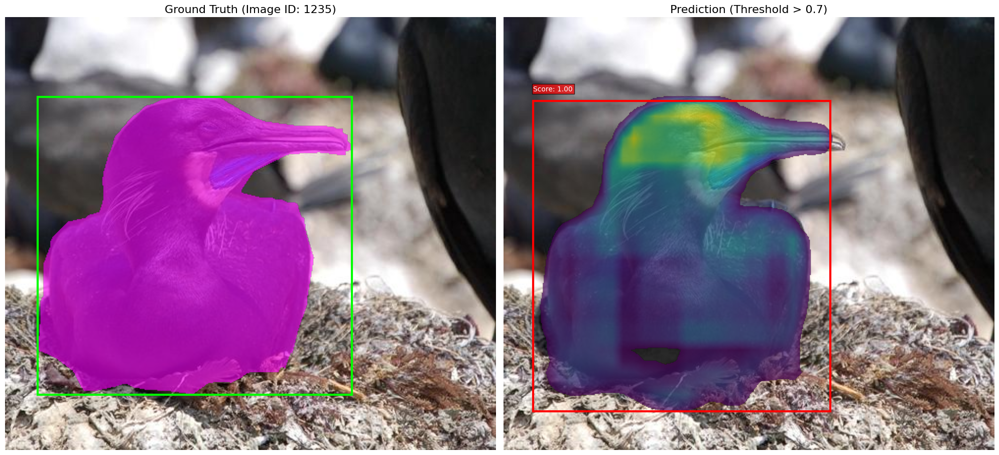


--- Prediction Diagnostics for Image ID: 3146 ---
   Detection 1 (Score: 1.00): Max mask confidence is 0.3603


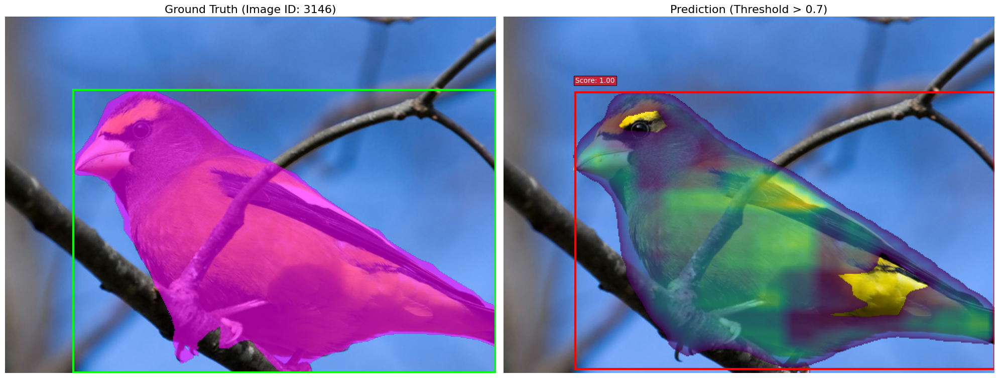


--- Prediction Diagnostics for Image ID: 198 ---
   Detection 1 (Score: 1.00): Max mask confidence is 0.5952


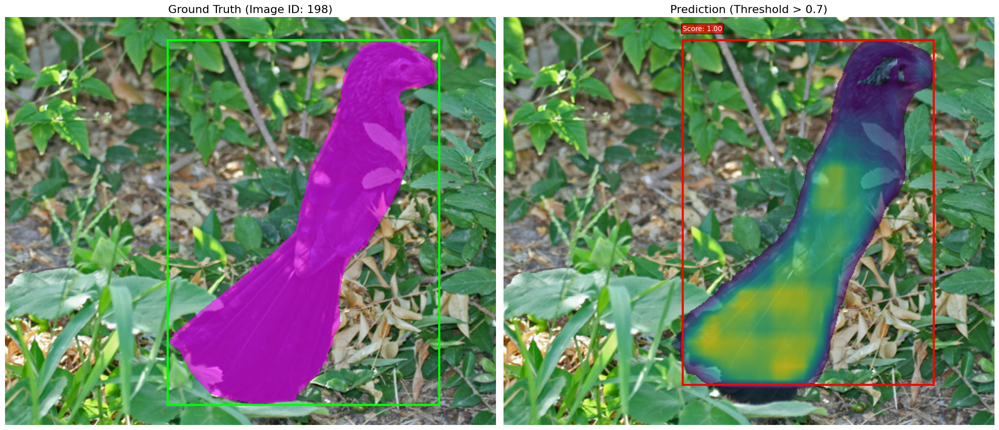

In [ ]:
# ================================================================================================
# 6. MODEL EVALUATION AND VISUALIZATION
# ================================================================================================

# load final model if not already loaded
if 'model' in locals() and not model.training:
    final_model_path = os.path.join("model_checkpoints", "mask_rcnn_burung_final.pth")
    if os.path.exists(final_model_path):
        print("Loading final model for evaluation...")
        model = load_model_from_checkpoint(model, final_model_path, device)
    else:
        print(f"\n⚠️ Final model '{os.path.basename(final_model_path)}' not found. Using the last loaded model.")

def calculate_iou(boxes1, boxes2):
    """
    Calculate Intersection over Union (IoU) for two sets of boxes.
    """
    return box_iou(boxes1, boxes2)

def evaluate_model(model, data_loader, device, score_threshold=0.5):
    """
    Evaluate the model on the validation dataset.
    """
    model.eval()
    all_predictions = []
    all_targets = []
    
    print(f"\n📊 Evaluating model on validation data (Threshold: {score_threshold})...")
    
    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc="Evaluating"):
            images = list(img.to(device) for img in images)
            outputs = model(images)
            
            for i, output in enumerate(outputs):
                keep = output['scores'] > score_threshold
                filtered_output = {k: v[keep] for k, v in output.items()}
                preds_cpu = {k: v.to('cpu') for k, v in filtered_output.items()}
                targs_cpu = {k: v.to('cpu') for k, v in targets[i].items()}
                all_predictions.append(preds_cpu)
                all_targets.append(targs_cpu)

    total_preds = sum(len(p['boxes']) for p in all_predictions)
    total_gts = sum(len(t['boxes']) for t in all_targets)
    print(f"   Total Predictions (filtered): {total_preds}")
    print(f"   Total Ground Truths: {total_gts}")

    iou_threshold = 0.5
    true_positives = 0
    
    for preds, targs in zip(all_predictions, all_targets):
        if len(preds['boxes']) == 0 or len(targs['boxes']) == 0:
            continue
        iou_matrix = calculate_iou(preds['boxes'], targs['boxes'])
        if iou_matrix.numel() > 0:
            matched_preds = (iou_matrix.max(dim=0)[0] >= iou_threshold).sum().item()
            true_positives += matched_preds

    precision = true_positives / total_preds if total_preds > 0 else 0
    recall = true_positives / total_gts if total_gts > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    print(f"\n   📈 Evaluation Metrics (IoU Threshold: {iou_threshold}):")
    print(f"      Precision: {precision:.3f}")
    print(f"      Recall: {recall:.3f}")
    print(f"      F1-Score: {f1_score:.3f}")

    return {
        'precision': precision,
        'recall': recall,
        'f1_score': f1_score,
        'predictions': all_predictions,
        'targets': all_targets
    }

def visualize_evaluation_sample(dataset, model, device, sample_idx, score_threshold=0.5):
    """
    Visualize a single sample with ground truth and prediction, including diagnostics.
    """
    img_tensor, target = dataset[sample_idx]
    
    model.eval()
    with torch.no_grad():
        prediction = model([img_tensor.to(device)])[0]

    img_pil = T.ToPILImage()(img_tensor)
    
    keep = prediction['scores'] > score_threshold
    pred_boxes = prediction['boxes'][keep].cpu().numpy()
    pred_masks = prediction['masks'][keep].cpu().numpy()
    pred_scores = prediction['scores'][keep].cpu().numpy()
    
    gt_boxes = target['boxes'].cpu().numpy()
    gt_masks = target['masks'].cpu().numpy()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    # Plot Ground Truth
    ax1.imshow(img_pil)
    ax1.set_title(f'Ground Truth (Image ID: {target["image_id"].item()})', fontsize=16)
    ax1.axis('off')
    for i in range(len(gt_boxes)):
        box = gt_boxes[i]
        rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], fill=False, edgecolor='lime', linewidth=3)
        ax1.add_patch(rect)
        mask = gt_masks[i]
        ax1.imshow(np.ma.masked_where(mask == 0, mask), cmap='spring', alpha=0.6)

    # Plot Prediction
    ax2.imshow(img_pil)
    ax2.set_title(f'Prediction (Threshold > {score_threshold})', fontsize=16)
    ax2.axis('off')
    
    print(f"\n--- Prediction Diagnostics for Image ID: {target['image_id'].item()} ---")
    if len(pred_boxes) == 0:
        print("   No predictions above threshold.")
    
    for i in range(len(pred_boxes)):
        box = pred_boxes[i]
        score = pred_scores[i]
        mask_prob = pred_masks[i, 0]
        
        # --- DIAGNOSTIC PRINT ---
        max_mask_prob = np.max(mask_prob)
        print(f"   Detection {i+1} (Score: {score:.2f}): Max mask confidence is {max_mask_prob:.4f}")
        
        # Draw mask regardless of confidence for visualization
        mask_binary = (mask_prob > 0.5) # Keep 0.5 for official drawing, but print the max value
        if max_mask_prob > 0.1: # Only draw if there's at least *some* signal
             ax2.imshow(np.ma.masked_where(mask_prob < 0.1, mask_prob), cmap='viridis', alpha=0.7)

        # Draw bounding box and label
        rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], fill=False, edgecolor='red', linewidth=3)
        ax2.add_patch(rect)
        ax2.text(box[0], box[1]-10, f'Score: {score:.2f}', bbox={'facecolor': 'red', 'alpha': 0.7, 'pad': 2}, color='white')

    plt.tight_layout()
    plt.show()

# --- Execution ---
if 'data_loader_val' in locals():
    evaluation_results = evaluate_model(model, data_loader_val, device, score_threshold=0.7)
    
    print("\n🖼️  Visualizing some validation samples with diagnostics...")
    if len(dataset_val) > 0:
        num_samples_to_show = min(3, len(dataset_val))
        random_indices = random.sample(range(len(dataset_val)), num_samples_to_show)
        
        for idx in random_indices:
            visualize_evaluation_sample(dataset_val, model, device, idx, score_threshold=0.7)
    else:
        print("   ⚠️ No validation samples to visualize.")
else:
    print("\n⚠️  Validation data loader not found. Skipping evaluation and visualization.")

🧪 Setting up multi-image test...

✅ The following test images were found and will be processed:
   - test/img_6942.jpeg
   - test/Screenshot 2025-06-19 191926.png
   - test/Screenshot 2025-06-19 192016.png
   - test/Screenshot 2025-06-19 192157.png
   - test/Screenshot 2025-06-19 192812.png

🧪 Testing model on 5 images...

--- Image 1/5 ---
🔍 Analyzing image: img_6942.jpeg
   🧠 Running inference...
   ⏱️  Inference time: 0.437 seconds
   🎯 Found 2 detections (threshold > 0.7)

--- Prediction Diagnostics ---
   Detection 1 (Score: 1.00): Maximum mask confidence is 0.2459
   Detection 2 (Score: 1.00): Maximum mask confidence is 0.5319


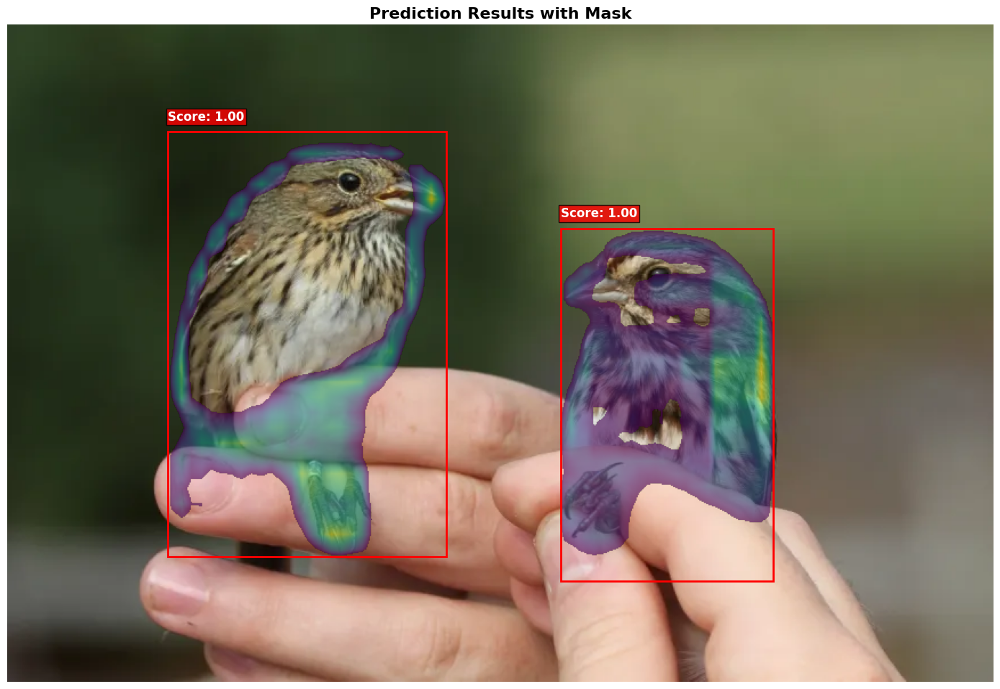


--- Image 2/5 ---
🔍 Analyzing image: Screenshot 2025-06-19 191926.png
   🧠 Running inference...
   ⏱️  Inference time: 0.092 seconds
   🎯 Found 3 detections (threshold > 0.7)

--- Prediction Diagnostics ---
   Detection 1 (Score: 1.00): Maximum mask confidence is 0.8141
   Detection 2 (Score: 1.00): Maximum mask confidence is 0.6210
   Detection 3 (Score: 1.00): Maximum mask confidence is 0.6613


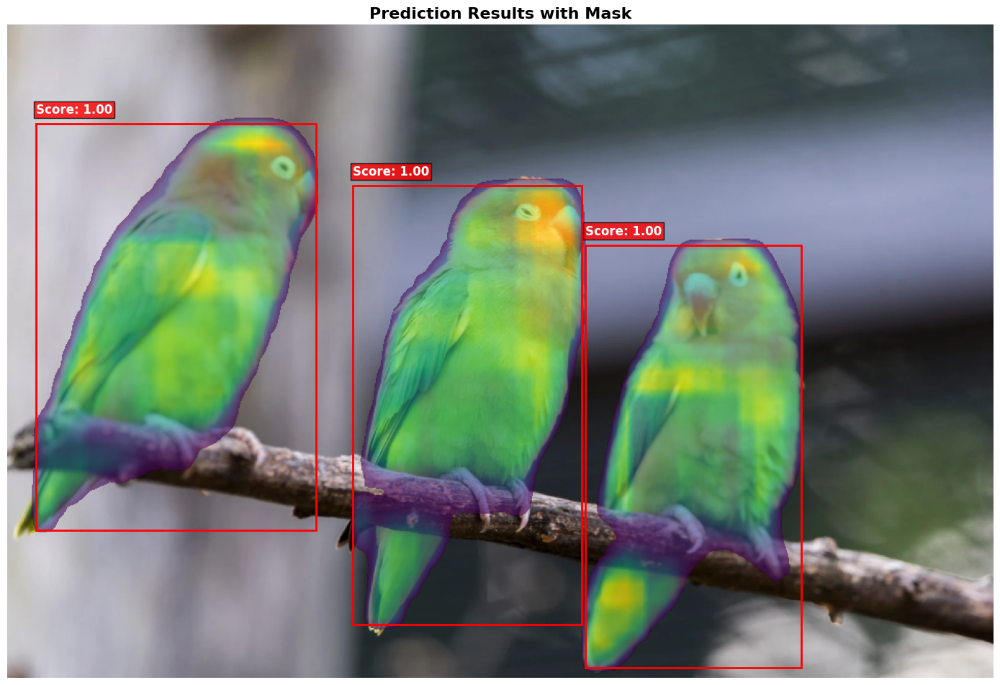


--- Image 3/5 ---
🔍 Analyzing image: Screenshot 2025-06-19 192016.png
   🧠 Running inference...
   ⏱️  Inference time: 0.133 seconds
   🎯 Found 10 detections (threshold > 0.7)

--- Prediction Diagnostics ---
   Detection 1 (Score: 1.00): Maximum mask confidence is 0.7114
   Detection 2 (Score: 1.00): Maximum mask confidence is 0.7044
   Detection 3 (Score: 1.00): Maximum mask confidence is 0.7851
   Detection 4 (Score: 0.99): Maximum mask confidence is 0.5031
   Detection 5 (Score: 0.99): Maximum mask confidence is 0.2354
   Detection 6 (Score: 0.99): Maximum mask confidence is 0.7341
   Detection 7 (Score: 0.96): Maximum mask confidence is 0.8270
   Detection 8 (Score: 0.90): Maximum mask confidence is 0.2380
   Detection 9 (Score: 0.90): Maximum mask confidence is 0.7000
   Detection 10 (Score: 0.70): Maximum mask confidence is 0.6796


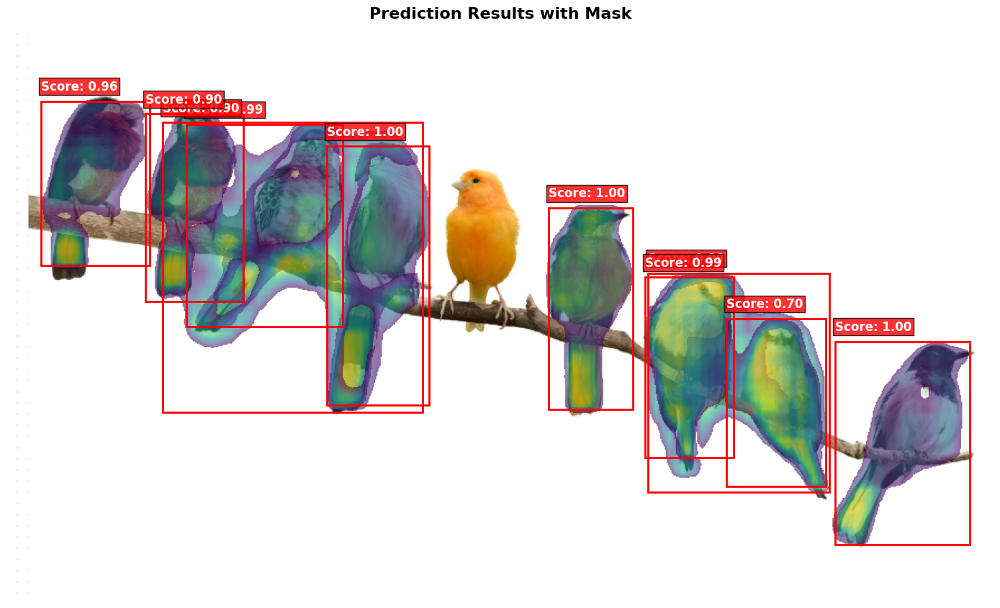


--- Image 4/5 ---
🔍 Analyzing image: Screenshot 2025-06-19 192157.png
   🧠 Running inference...
   ⏱️  Inference time: 0.213 seconds
   🎯 Found 4 detections (threshold > 0.7)

--- Prediction Diagnostics ---
   Detection 1 (Score: 1.00): Maximum mask confidence is 0.5024
   Detection 2 (Score: 1.00): Maximum mask confidence is 0.2310
   Detection 3 (Score: 1.00): Maximum mask confidence is 0.8600
   Detection 4 (Score: 0.97): Maximum mask confidence is 0.6085


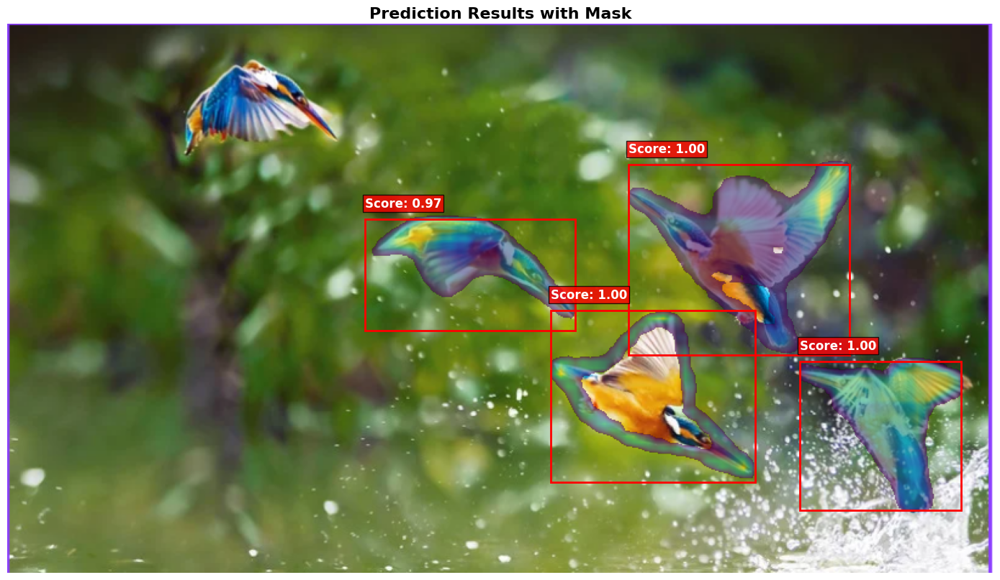


--- Image 5/5 ---
🔍 Analyzing image: Screenshot 2025-06-19 192812.png
   🧠 Running inference...
   ⏱️  Inference time: 0.126 seconds
   🎯 Found 6 detections (threshold > 0.7)

--- Prediction Diagnostics ---
   Detection 1 (Score: 1.00): Maximum mask confidence is 0.5769
   Detection 2 (Score: 1.00): Maximum mask confidence is 0.6337
   Detection 3 (Score: 1.00): Maximum mask confidence is 0.7201
   Detection 4 (Score: 1.00): Maximum mask confidence is 0.5455
   Detection 5 (Score: 0.96): Maximum mask confidence is 0.7218
   Detection 6 (Score: 0.75): Maximum mask confidence is 0.2765


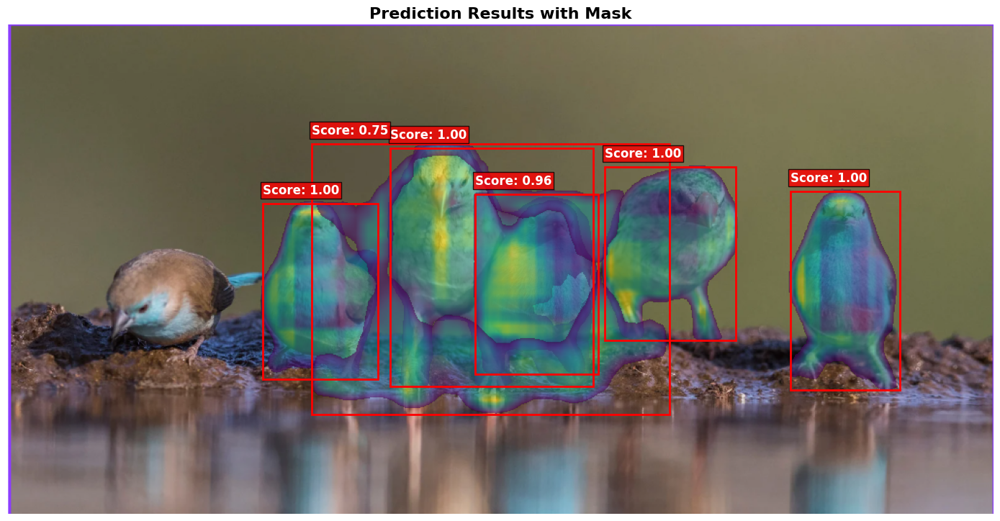


📊 FINAL TEST SUMMARY
   Images Processed: 5
   Total Detections: 25
   Average Detections per Image: 5.00
   Average Inference Time: 0.200s


In [ ]:
# ================================================================================================
# 7. PREDICTION AND TESTING (MATPLOTLIB STYLE, MULTI-IMAGE SUPPORT)
# ================================================================================================

def predict_image(image_path, model, device, score_threshold=0.7, display_results=True):
    """
    Performs prediction on a single image and displays it.
    
    Args:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The trained model.
        device (torch.device): Computation device (CPU/GPU).
        score_threshold (float): Confidence threshold for displaying detections.
        display_results (bool): Whether to display the visualization results.
        
    Returns:
        dict: A dictionary containing prediction statistics and results.
    """
    print(f"🔍 Analyzing image: {os.path.basename(image_path)}")
    if not os.path.exists(image_path):
        print(f"❌ Image not found: {image_path}")
        return None
    
    try:
        img_pil = Image.open(image_path).convert("RGB")
        img_tensor = F.to_tensor(img_pil).to(device)
        
        model.eval()
        print("   🧠 Running inference...")
        start_time = time.time()
        with torch.no_grad():
            predictions = model([img_tensor])
        inference_time = time.time() - start_time
        print(f"   ⏱️  Inference time: {inference_time:.3f} seconds")
        
        output = predictions[0]
        pred_scores = output['scores'].cpu().numpy()
        keep_indices = np.where(pred_scores > score_threshold)[0]
        
        filtered_results = {
            'boxes': output['boxes'][keep_indices].cpu().numpy(),
            'labels': output['labels'][keep_indices].cpu().numpy(),
            'scores': output['scores'][keep_indices].cpu().numpy(),
            'masks': output['masks'][keep_indices].cpu().numpy()
        }
        
        num_detections = len(filtered_results['boxes'])
        print(f"   🎯 Found {num_detections} detections (threshold > {score_threshold})")
        
        if display_results:
            if num_detections > 0:
                visualize_predictions_matplotlib(img_pil, filtered_results)
            else:
                print("   ⚠️ No objects detected above the threshold to visualize.")
                plt.figure(figsize=(10, 8))
                plt.imshow(img_pil)
                plt.title("No Detections")
                plt.axis('off')
                plt.show()
            
        return {
            'image_path': image_path,
            'num_detections': num_detections,
            'inference_time': inference_time,
            'predictions': filtered_results
        }
        
    except Exception as e:
        print(f"❌ An error occurred while processing the image: {e}")
        return None

def visualize_predictions_matplotlib(img_pil, predictions):
    """
    Visualizes predictions using Matplotlib, similar to Phase 6.
    """
    plt.figure(figsize=(14, 10))
    plt.imshow(img_pil)
    ax = plt.gca()

    print("\n--- Prediction Diagnostics ---")
    
    for i in range(len(predictions['boxes'])):
        box = predictions['boxes'][i]
        score = predictions['scores'][i]
        mask_prob = predictions['masks'][i, 0]
        max_mask_prob = np.max(mask_prob)
        print(f"   Detection {i+1} (Score: {score:.2f}): Maximum mask confidence is {max_mask_prob:.4f}")

        if max_mask_prob > 0.1:
            masked_array = np.ma.masked_where(mask_prob < 0.1, mask_prob)
            ax.imshow(masked_array, cmap='viridis', alpha=0.6)

        rect = plt.Rectangle(
            (box[0], box[1]), box[2] - box[0], box[3] - box[1],
            fill=False, edgecolor='red', linewidth=2
        )
        ax.add_patch(rect)
        
        label = f"Score: {score:.2f}"
        ax.text(
            box[0], box[1] - 10, label,
            bbox={'facecolor': 'red', 'alpha': 0.8, 'pad': 2},
            color='white', fontsize=12, weight='bold'
        )

    plt.title("Prediction Results with Mask", fontsize=16, weight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def test_multiple_images(image_paths, model, device, score_threshold=0.7):
    """
    Tests the model on a list of images and provides a summary.
    
    Args:
        image_paths (list): A list of paths to the image files.
        model (torch.nn.Module): The trained model.
        device (torch.device): Computation device.
        score_threshold (float): Confidence threshold for predictions.
    """
    print(f"\n🧪 Testing model on {len(image_paths)} images...")
    print("=" * 60)
    
    results_summary = []
    total_detections = 0
    total_time = 0
    
    for i, path in enumerate(image_paths):
        print(f"\n--- Image {i+1}/{len(image_paths)} ---")
        result = predict_image(path, model, device, score_threshold, display_results=True)
        if result:
            results_summary.append(result)
            total_detections += result['num_detections']
            total_time += result['inference_time']
    
    print("\n" + "=" * 60)
    print("📊 FINAL TEST SUMMARY")
    print("=" * 60)
    if results_summary:
        print(f"   Images Processed: {len(results_summary)}")
        print(f"   Total Detections: {total_detections}")
        print(f"   Average Detections per Image: {total_detections / len(results_summary):.2f}")
        print(f"   Average Inference Time: {total_time / len(results_summary):.3f}s")
    else:
        print("   No images were processed successfully.")
    print("=" * 60)

test_image_paths = [
    'test/img_6942.jpeg',
    'test/Screenshot 2025-06-19 191926.png',
    'test/Screenshot 2025-06-19 192016.png',
    'test/Screenshot 2025-06-19 192157.png',
    'test/Screenshot 2025-06-19 192812.png',
]

# Validate which images exist before processing
valid_images = [path for path in test_image_paths if os.path.exists(path)]
invalid_images = [path for path in test_image_paths if not os.path.exists(path)]

if invalid_images:
    print("\n⚠️  The following test images were not found and will be skipped:")
    for path in invalid_images:
        print(f"   - {path}")

if valid_images:
    print("\n✅ The following test images were found and will be processed:")
    for path in valid_images:
        print(f"   - {path}")
    # Run the test on the list of valid images
    test_multiple_images(valid_images, model, device, score_threshold=0.7)
else:
    print("❌ No valid test images found. Please check the paths in the 'test_image_paths'")